# BPIC 2019 – PM² Process Mining Analysis with WISE Data

This notebook-style Markdown implements a **typical PM² process-mining
workflow** for the BPI Challenge 2019 Purchase-to-Pay (P2P) log, using the
pre-extracted datasets from your WISE project:

- `bpic19_raw_log.csv` – full raw event log,
- `df_subset_3-way_match_invoice_after_GR.csv` – 3-way match, invoice after GR,
- `case_features_3-way_match_invoice_after_GR.csv` – case-level features,
- `case_scores_3-way_match_invoice_after_GR.csv` – WISE case scores (Finance & Logistics),
- `case_full_3-way_match_invoice_after_GR.csv` – features joined with scores,
- `slice_summary_3-way_match_invoice_after_GR.csv` – slice-level aggregated scores.

We will:

1. Load and explore the **full P2P event log**.
2. Derive the **four process types** (3-way after GR, 3-way before GR, 2-way, consignment).
3. Follow the PM² phases:
   - **Planning & scoping** (business questions, KPIs),
   - **Data understanding & preparation**,
   - **Event log creation** (for pm4py),
   - **Process discovery** (DFG, Petri nets),
   - **Conformance checking** (basic reference model),
   - **Performance analysis** (PPIs: throughput, rework, cancellations),
   - **Enhancement** with WISE scores and slice summaries.
4. Summarise key PPIs and connect them to **actionable insights**.

> You can convert this file to a Jupyter notebook with:
>
> ```bash
> jupytext --to ipynb BPIC19_Pm2_WISE_Analysis.md
> ```

---

## 0. Setup and data loading

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

import pm4py

Load the pre-computed CSVs. Adjust the path if needed.

In [2]:
data_path = Path("/Users/ula/code/PhD/WISE/WISE/Untitled/src/wise/analysis/data/results_BPIC_2019")

data = {
    "df_full"       : pd.read_csv(data_path / "bpic19_raw_log.csv"),
    "df_subset"     : pd.read_csv(data_path / "df_subset_3-way_match_invoice_after_GR.csv"),
    "case_features" : pd.read_csv(data_path / "case_features_3-way_match_invoice_after_GR.csv"),
    "case_scores"   : pd.read_csv(data_path / "case_scores_3-way_match_invoice_after_GR.csv"),
    "case_full"     : pd.read_csv(data_path / "case_full_3-way_match_invoice_after_GR.csv"),
    "slice_summary" : pd.read_csv(data_path / "slice_summary_3-way_match_invoice_after_GR.csv"),
}

df_full       = data["df_full"]
df_subset     = data["df_subset"]
case_features = data["case_features"]
case_scores   = data["case_scores"]
case_full     = data["case_full"]
slice_summary = data["slice_summary"]

df_full.head()

,eventID,case Spend area text,case Company,case Document Type,case Sub spend area text,case Purchasing Document,case Purch. Doc. Category name,case Vendor,case Item Type,case Item Category,...,case Name,case GR-Based Inv. Verif.,case Item,case concept:name,case Goods Receipt,event User,event org:resource,event concept:name,event Cumulative net worth (EUR),event time:timestamp
0,65781719105536,Sales,companyID_0000,Standard PO,Products for Resale,4507004931,Purchase order,vendorID_0670,Standard,"3-way match, invoice before GR",...,vendor_0645,False,20,4507004931_00020,True,NONE,NONE,Vendor creates invoice,68.0,1948-01-26 23:59:00
1,65777424138241,Sales,companyID_0000,Standard PO,Products for Resale,4507004931,Purchase order,vendorID_0670,Standard,"3-way match, invoice before GR",...,vendor_0645,False,10,4507004931_00010,True,NONE,NONE,Vendor creates debit memo,325.0,1948-01-26 23:59:00
2,65777424138240,Sales,companyID_0000,Standard PO,Products for Resale,4507004931,Purchase order,vendorID_0670,Standard,"3-way match, invoice before GR",...,vendor_0645,False,10,4507004931_00010,True,NONE,NONE,Vendor creates invoice,325.0,1948-01-26 23:59:00
3,65794604007424,Sales,companyID_0000,Standard PO,Products for Resale,4507004931,Purchase order,vendorID_0670,Standard,"3-way match, invoice before GR",...,vendor_0645,False,50,4507004931_00050,True,NONE,NONE,Vendor creates invoice,102.0,1948-01-26 23:59:00
4,65794604007425,Sales,companyID_0000,Standard PO,Products for Resale,4507004931,Purchase order,vendorID_0670,Standard,"3-way match, invoice before GR",...,vendor_0645,False,50,4507004931_00050,True,NONE,NONE,Vendor creates debit memo,102.0,1948-01-26 23:59:00


Check the basic shape and column names:

In [3]:
print("Full log shape:", df_full.shape)
df_full.columns

Full log shape: (1595923, 22)


Index(['eventID ', 'case Spend area text', 'case Company',
       'case Document Type', 'case Sub spend area text',
       'case Purchasing Document', 'case Purch. Doc. Category name',
       'case Vendor', 'case Item Type', 'case Item Category',
       'case Spend classification text', 'case Source', 'case Name',
       'case GR-Based Inv. Verif.', 'case Item', 'case concept:name',
       'case Goods Receipt', 'event User', 'event org:resource',
       'event concept:name', 'event Cumulative net worth (EUR)',
       'event time:timestamp'],
      dtype='object')

Most BPIC 2019 logs use:

- `case:concept:name` – case identifier (PO line item),
- `concept:name` – activity name,
- `time:timestamp` – event time.

If your file uses slightly different column names (e.g. `"case concept:name"`),
normalise them:

In [4]:
df_full = df_full.rename(columns={
    "case concept:name": "case:concept:name",
    "event concept:name": "concept:name",
    "event time:timestamp": "time:timestamp",
})

---

## 1. PM² Phase: Project Planning & Scoping

In PM², the first phase clarifies:

- **Process scope**: Purchase-to-Pay (P2P) from PO creation to invoice clearing.
- **Main questions** (from the BPIC 2019 challenge):
  - What does the process look like for different item categories?
  - Where are **throughput** and **compliance** problems?
  - Which combinations of company, spend area, item category, etc. cause the
    most rework and delays?
- **Key stakeholders**:
  - Finance (Accounts Payable, Controlling),
  - Logistics / Supply Chain,
  - Procurement / Category Management,
  - IT and Process Mining team.

In this notebook we will:

- Analyse the **whole log** to understand global structure,
- Drill down into the **4 process types**,
- Enhance the analysis using **WISE** scores for the 3-way-after-GR subset.

---

## 2. PM² Phase: Data Understanding & Preparation

### 2.1. Basic statistics on the full log

In [5]:
df_full["time:timestamp"] = pd.to_datetime(df_full["time:timestamp"], errors="coerce")

n_events = len(df_full)
n_cases  = df_full["case:concept:name"].nunique()

print("Events:", n_events)
print("Cases :", n_cases)

Events: 1595923
Cases : 251734


Inspect the most frequent activities:

In [6]:
df_full["concept:name"].value_counts().head(15)

concept:name
Record Goods Receipt                  314097
Create Purchase Order Item            251734
Record Invoice Receipt                228760
Vendor creates invoice                219919
Clear Invoice                         194393
Record Service Entry Sheet            164975
Remove Payment Block                   57136
Create Purchase Requisition Item       46592
Receive Order Confirmation             32065
Change Quantity                        21449
Change Price                           12423
Delete Purchase Order Item              8875
Change Approval for Purchase Order      7541
Cancel Invoice Receipt                  7096
Vendor creates debit memo               6255
Name: count, dtype: int64

Distribution of **events per case**:

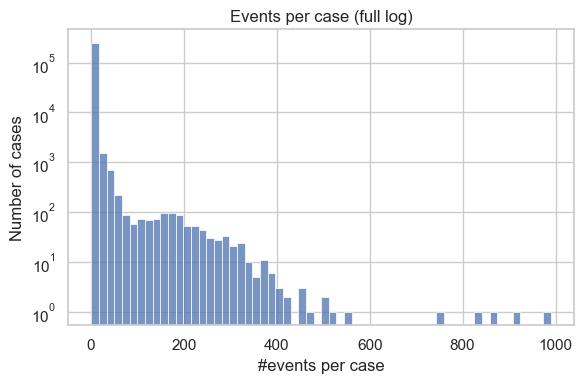

In [7]:
events_per_case = df_full.groupby("case:concept:name")["concept:name"].count()
events_per_case.describe()

plt.figure(figsize=(6,4))
sns.histplot(events_per_case, bins=60)
plt.title("Events per case (full log)")
plt.xlabel("#events per case")
plt.ylabel("Number of cases")
plt.yscale("log")  # often skewed
plt.tight_layout()
plt.show()

**Business interpretation.**

- Many cases with just a few events may represent simple, low-value lines.
- Cases with very many events are likely complex (many GRs, changes, cancellations).
- These patterns foreshadow **complexity clusters** in WISE.

### 2.2. Derive the 4 process types

BPIC 2019 distinguishes four main **item categories**, for example:

- `"3-way match, invoice after GR"`,
- `"3-way match, invoice before GR"`,
- `"2-way match"`,
- `"Consignment"` (or similar label).

Check the actual labels:

In [8]:
item_col_candidates = ["case:Item Category", "case Item Category"]
item_col = [c for c in item_col_candidates if c in df_full.columns][0]
df_full[item_col].value_counts()

case Item Category
3-way match, invoice before GR    1234708
3-way match, invoice after GR      319233
Consignment                         36084
2-way match                          5898
Name: count, dtype: int64

Define subsets:

In [9]:
three_way_after_labels  = ["3-way match, invoice after GR"]       # adapt if needed
three_way_before_labels = ["3-way match, invoice before GR"]
two_way_labels          = ["2-way match"]
consignment_labels      = ["Consignment"]

df_3way_after  = df_full[df_full[item_col].isin(three_way_after_labels)].copy()
df_3way_before = df_full[df_full[item_col].isin(three_way_before_labels)].copy()
df_2way        = df_full[df_full[item_col].isin(two_way_labels)].copy()
df_cons        = df_full[df_full[item_col].isin(consignment_labels)].copy()

for name, df_part in [
    ("3-way after GR" , df_3way_after),
    ("3-way before GR", df_3way_before),
    ("2-way"          , df_2way),
    ("Consignment"    , df_cons),
]:
    print(f"{name:16s} cases={df_part['case:concept:name'].nunique():7d}, events={len(df_part):8d}")

3-way after GR   cases=  15182, events=  319233
3-way before GR  cases= 221010, events= 1234708
2-way            cases=   1044, events=    5898
Consignment      cases=  14498, events=   36084


**Business note.**

- 3-way-after-GR is the **classic 3-way match**: GR must precede INV, then CLEAR.
- 3-way-before-GR: INV arrives before GR (blocked until goods receipt).
- 2-way: no GR, only PO vs INV.
- Consignment: GR exists, invoicing happens in a separate settlement.

---

## 3. PM² Phase: Event Log Creation (pm4py)

pm4py uses a specific event log structure. We convert our dataframes.

In [16]:
from pm4py.objects.log.util import dataframe_utils
import pm4py

def to_event_log(
    df,
    case_col="case:concept:name",
    activity_col="concept:name",
    timestamp_col="time:timestamp",
):
    """
    Convert a pandas DataFrame into a pm4py EventLog using the modern pm4py API.

    Assumes df has at least: case_col, activity_col, timestamp_col.
    """

    # Ensure timestamp columns are proper datetimes
    df = dataframe_utils.convert_timestamp_columns_in_df(df)

    # Rename columns if necessary to match pm4py defaults
    # (only needed if your DataFrame doesn't already use these names)
    rename_map = {}
    if case_col != "case:concept:name":
        rename_map[case_col] = "case:concept:name"
    if activity_col != "concept:name":
        rename_map[activity_col] = "concept:name"
    if timestamp_col != "time:timestamp":
        rename_map[timestamp_col] = "time:timestamp"

    if rename_map:
        df = df.rename(columns=rename_map)
        case_col = "case:concept:name"
        activity_col = "concept:name"
        timestamp_col = "time:timestamp"

    # Use pm4py's format_dataframe to declare the keys
    df_fmt = pm4py.format_dataframe(
        df,
        case_id=case_col,
        activity_key=activity_col,
        timestamp_key=timestamp_col,
    )

    # Finally convert to EventLog
    elog = pm4py.convert_to_event_log(df_fmt)
    return elog


---

## 4. PM² Phase: Process Discovery

We now discover process models.

### 4.1. Directly-Follows Graph (DFG) – full log

In [19]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer

elog = to_event_log(df_3way_after)

# discover DFG
dfg_full = dfg_discovery.apply(elog)

# visualise DFG (frequency variant)
gviz = dfg_visualizer.apply(
    dfg_full,
    log=elog,
    variant=dfg_visualizer.Variants.FREQUENCY
)
dfg_visualizer.view(gviz)


> This DFG shows the “spaghetti” of all P2P variants. You should see paths
> from PO creation through GR and INV to CLEAR, but also loops and side paths.

### 4.2. DFGs per process type

In [ ]:

elog_3way_after  = to_event_log(df_3way_after)
elog_3way_before = to_event_log(df_3way_before)
elog_2way        = to_event_log(df_2way)
elog_cons        = to_event_log(df_cons)

for name, elog in [
    ("3-way after GR" , elog_3way_after),
    ("3-way before GR", elog_3way_before),
    ("2-way"          , elog_2way),
    ("Consignment"    , elog_cons),
]:
    print(f"=== DFG for {name} ===")
    dfg = dfg_factory.apply(elog)
    gviz = dfg_vis_factory.apply(
        dfg, log=elog, variant="frequency",
        parameters={"format": "svg"}
    )
    dfg_vis_factory.view(gviz)

=== DFG for 3-way after GR ===


NameError: name 'dfg_factory' is not defined

**Business interpretation.**

- 3-way-after-GR should show a clear sequence: PO → GR → INV → CLEAR.
- 3-way-before-GR: INV before GR leading to blocks/unblocks.
- 2-way: no GR path.
- Consignment: GRs without invoices.

Differences hint at **policy vs practice**: e.g., many cases where GR is missing or late.

### 4.3. Inductive Miner Petri nets per type

In [ ]:
from pm4py.algo.discovery.inductive import factory as inductive_miner
from pm4py.visualization.petri_net import factory as pn_vis_factory

def discover_and_view_pn(elog, name=""):
    net, im, fm = inductive_miner.apply(elog)
    print(f"Petri net discovered for {name}")
    gviz = pn_vis_factory.apply(net, im, fm, parameters={"format": "svg"})
    pn_vis_factory.view(gviz)
    return net, im, fm

net_3way_after, im_3way_after, fm_3way_after = discover_and_view_pn(elog_3way_after, "3-way after GR")
net_3way_before, im_3way_before, fm_3way_before = discover_and_view_pn(elog_3way_before, "3-way before GR")
net_2way, im_2way, fm_2way = discover_and_view_pn(elog_2way, "2-way")
net_cons, im_cons, fm_cons = discover_and_view_pn(elog_cons, "Consignment")

> These nets provide structured models suitable for conformance checking and
> further analysis.

---

## 5. PM² Phase: Conformance Checking

For 3-way-after-GR, we can define a **simple reference model**:

In [ ]:
from pm4py.objects.petri import petrinet, utils as petri_utils
from pm4py.objects.petri.petrinet import PetriNet
from pm4py.objects.petri import marking as pm_marking

net = PetriNet("p2p_3way_after")

# Places
p_start = PetriNet.Place("p_start")
p_po    = PetriNet.Place("p_po")
p_gr    = PetriNet.Place("p_gr")
p_inv   = PetriNet.Place("p_inv")
p_end   = PetriNet.Place("p_end")
net.places.update({p_start, p_po, p_gr, p_inv, p_end})

# Transitions
t_po    = PetriNet.Transition("Create Purchase Order Item", "Create Purchase Order Item")
t_gr    = PetriNet.Transition("Record Goods Receipt", "Record Goods Receipt")
t_inv   = PetriNet.Transition("Record Invoice Receipt", "Record Invoice Receipt")
t_clear = PetriNet.Transition("Clear Invoice", "Clear Invoice")
net.transitions.update({t_po, t_gr, t_inv, t_clear})

# Arcs
petri_utils.add_arc_from_to(p_start, t_po, net)
petri_utils.add_arc_from_to(t_po, p_po, net)
petri_utils.add_arc_from_to(p_po, t_gr, net)
petri_utils.add_arc_from_to(t_gr, p_gr, net)
petri_utils.add_arc_from_to(p_gr, t_inv, net)
petri_utils.add_arc_from_to(t_inv, p_inv, net)
petri_utils.add_arc_from_to(p_inv, t_clear, net)
petri_utils.add_arc_from_to(t_clear, p_end, net)

im = pm_marking.Marking({p_start: 1})
fm = pm_marking.Marking({p_end: 1})

Align the 3-way-after-GR log against this model:

In [ ]:
from pm4py.algo.conformance.alignments.petri_net import algorithm as align_algo

elog_for_align = elog_3way_after

aligned = align_algo.apply_log(elog_for_align, net, im, fm)
len(aligned), aligned[0]

Compute basic fitness and precision:

In [ ]:
from pm4py.algo.evaluation.replay_fitness import evaluator as fitness_evaluator
from pm4py.algo.evaluation.precision import evaluator as precision_evaluator

fitness = fitness_evaluator.apply(
    elog_for_align, net, im, fm,
    variant=fitness_evaluator.Variants.ALIGNMENT_BASED
)
precision = precision_evaluator.apply(elog_for_align, net, im, fm)

print("Alignment-based fitness :", fitness["average_trace_fitness"])
print("ETConformance precision :", precision)

> Interpretation:
>
> - High fitness but low precision → the model is more permissive than the log.
> - Low fitness → many real traces deviate from the simple reference model
>   (e.g. missing GR, extra activities, or loops).

---

## 6. PM² Phase: Performance Analysis (PPIs)

We now compute some **PPIs** across the four process types.

### 6.1. Throughput and waiting times (3-way-after-GR)

In [ ]:
def compute_lead_times(df, case_col="case:concept:name",
                       act_col="concept:name", ts_col="time:timestamp"):
    df = df.sort_values([case_col, ts_col])
    g = df.groupby(case_col)

    def first_time(df_sub, act):
        t = df_sub.loc[df_sub[act_col]==act, ts_col]
        return t.iloc[0] if not t.empty else pd.NaT

    records = []
    for case_id, df_case in g:
        t_po    = first_time(df_case, "Create Purchase Order Item")
        t_gr    = first_time(df_case, "Record Goods Receipt")
        t_inv   = first_time(df_case, "Record Invoice Receipt")
        t_clear = first_time(df_case, "Clear Invoice")
        records.append((case_id, t_po, t_gr, t_inv, t_clear))

    res = pd.DataFrame(records, columns=[case_col, "t_po", "t_gr", "t_inv", "t_clear"])
    res = res.dropna(subset=["t_po", "t_clear"])  # require full cycle
    res["ct_po_to_clear"]   = (res["t_clear"] - res["t_po"]).dt.days
    res["lag_gr_to_inv"]    = (res["t_inv"] - res["t_gr"]).dt.days
    res["lag_inv_to_clear"] = (res["t_clear"] - res["t_inv"]).dt.days
    return res

times_3way_after = compute_lead_times(df_3way_after)
times_3way_after[["ct_po_to_clear", "lag_gr_to_inv", "lag_inv_to_clear"]].describe()

Visualise cycle time distribution:

In [ ]:
plt.figure(figsize=(6,4))
sns.histplot(times_3way_after["ct_po_to_clear"], bins=60)
plt.title("Cycle time PO → CLEAR (3-way after GR)")
plt.xlabel("days")
plt.tight_layout()
plt.show()

Repeat for 3-way-before-GR, 2-way, and consignment to compare.

### 6.2. Rework: Change Price / Change Quantity

In [ ]:
def count_activity(df, activity):
    return df[df["concept:name"] == activity].groupby("case:concept:name")["concept:name"].count()

cp_counts = count_activity(df_3way_after, "Change Price")
cq_counts = count_activity(df_3way_after, "Change Quantity")

cp_counts.describe(), cq_counts.describe()

Plot:

In [ ]:
plt.figure(figsize=(6,4))
sns.histplot(cp_counts, bins=15)
plt.title("#Change Price per case (3-way after GR)")
plt.xlabel("count")
plt.tight_layout()
plt.show()

> High counts of price/quantity changes signal rework and unstable contracts.

### 6.3. Cancellations

In [ ]:
cancel_inv = count_activity(df_3way_after, "Cancel Invoice Receipt")
cancel_gr  = count_activity(df_3way_after, "Cancel Goods Receipt")

print("Share of cases with cancelled invoice:", (cancel_inv>0).mean())
print("Share of cases with cancelled GR     :", (cancel_gr>0).mean())

---

## 7. Enhancement: WISE case features and scores

Now we enrich the analysis with **WISE** data.

### 7.1. Case features

In [ ]:
case_features.head()

Typical columns:

- `po_to_gr_days`, `gr_to_inv_days`, `inv_to_clear_days`,
- `n_events`, `n_gr`, `n_inv`, `n_clear`, `n_price_changes`,
- `n_users`, `auto_ratio`, multiplicity measures, etc.

These are *precisely* the kinds of features used in PPIs and in
**explainable models** (SHAP/LIME).

### 7.2. Case scores

In [ ]:
case_scores.head()

You typically have:

- a WISE `score` per view (e.g. `Finance_score`, `Logistics_score`),
- or a generic `score` column.

Plot the distribution:

In [ ]:
score_col = "Finance_score" if "Finance_score" in case_scores.columns else "score"

plt.figure(figsize=(6,4))
sns.histplot(case_scores[score_col], bins=20)
plt.title(f"WISE scores – {score_col}")
plt.xlabel("score (0-1, higher is better)")
plt.tight_layout()
plt.show()

### 7.3. Case_full joining features and scores

In [ ]:
case_full.head()

`case_full` typically contains:

- case id, WISE scores, layer violations,
- engineered features,
- attributes such as company, spend area, item category,
- slice key used in `slice_summary`.

You can explore relationships, e.g. **cycle time vs score**:

In [ ]:
plt.figure(figsize=(6,4))
sns.scatterplot(data=case_full, x="ct_po_to_clear", y=score_col,
                hue="case Spend area text", alpha=0.6)
plt.xlabel("Cycle time PO → CLEAR (days)")
plt.ylabel(score_col)
plt.title("Cycle time vs WISE Finance score (3-way after GR)")
plt.tight_layout()
plt.show()

> This lets you see whether long cycle times correspond to worse WISE scores
> and which spend areas dominate the tails.

---

## 8. Enhancement: slice-level priorities (slice_summary)

`slice_summary` aggregates WISE scores per slice and usually includes:

- `n_cases`,
- `mean_score`, `shrunk_score`,
- slice descriptor (e.g. `slice_key` like `"Company | Spend area | Item category"`),
- layer-wise summaries or view-specific Priority Index.

Inspect:

In [ ]:
slice_summary.head()

Assuming `PI_Finance` and `slice_key`:

In [ ]:
slice_summary.sort_values("PI_Finance", ascending=False).head(10)

Plot top slices:

In [ ]:
plt.figure(figsize=(10,4))
top = slice_summary.sort_values("PI_Finance", ascending=False).head(12)
sns.barplot(data=top, x="PI_Finance", y="slice_key", orient="h")
plt.title("Top 12 slices by Finance Priority Index")
plt.xlabel("PI (Finance)")
plt.ylabel("Slice (Company | Spend area | Item category)")
plt.tight_layout()
plt.show()

### 8.1. Layer × slice heatmap (3-way after GR)

If `case_full` includes violation columns like `violation_presence`,
`violation_order_lag`, etc., we can compute layer means per slice:

In [ ]:
layer_cols = [c for c in case_full.columns if c.startswith("violation_")]

layer_summary = (case_full
                 .groupby("slice_key")[layer_cols]
                 .mean()
                 .reset_index())

# Focus on worst Finance slices
worst_keys = top["slice_key"].unique()
ls_worst = layer_summary[layer_summary["slice_key"].isin(worst_keys)]

matrix = ls_worst.set_index("slice_key")[layer_cols]
matrix.columns = [c.replace("violation_", "") for c in matrix.columns]

plt.figure(figsize=(10,4))
sns.heatmap(matrix, cmap="RdYlGn_r", annot=True, fmt=".2f")
plt.title("Layer-wise mean violation per slice (3-way after GR, Finance view)")
plt.xlabel("WISE layer / constraint")
plt.ylabel("Slice")
plt.tight_layout()
plt.show()

**Interpretation.**

- Rows: business slices, e.g. `companyID_0000 | Logistics | 3-way after GR`.
- Columns: WISE layers (Presence, Order/Lag, Balance, Singularity, Exclusion).
- Cells: how much that slice deviates on that layer (higher = worse).

This yields fine-grained insights such as:

- “Logistics 3-way after GR” → large singularity and exclusion violations
  (many changes, cancellations),
- “CAPEX & SOCS 3-way after GR” → significant order/lag and presence issues.

---

## 9. Summary of PPIs and WISE-enhanced insights

At the end of a PM²+WISE cycle, you can synthesise:

### 9.1. Classical process mining PPIs

Per process type and/or slice, summarise:

- event counts per case (complexity),
- cycle times and lags,
- counts of change and cancellation events,
- conformance fitness and precision.

### 9.2. WISE-based insights

Per slice:

- average and shrunk WISE scores (per view),
- layer-wise deviations (which type of constraint is systematically violated),
- Priority Index combining severity and volume.

### 9.3. Business interpretation

For BPIC 2019 P2P, typical patterns include:

- **Logistics 3-way after GR**:
  - many GR and change events per case,
  - long GR→INV and INV→CLEAR lags,
  - high L3/L4 deviations in WISE,
  - highest Finance Priority Index.

- **CAPEX & SOCS 3-way after GR**:
  - longer INV→CLEAR lags,
  - moderate WISE scores but significant L2 issues.

- **Other spend areas** (Marketing, Enterprise Services):
  - fewer cases but some with high rework and cancellations,
  - candidates for standardisation or additional controls.

Using WISE’s structured norm (presence, order/lag, singularity, exclusion)
and slice-first aggregation, these patterns can be turned into:

- **targeted improvement initiatives** (e.g. standardise GR practices,
  tighten price-change policy, streamline invoice approval),
- **clear KPIs** (e.g. reduce L2/L4 violations in Logistics by X%),
- and a baseline to monitor the effect of changes over time.

---

## 10. Next possible steps

To further mature the analysis:

- Integrate vendor and material dimensions (e.g. top `Vendor × Spend area` slices),
- Use explainable ML (SHAP/LIME) on `case_features` and WISE `score` to
  highlight which behavioural patterns drive badness,
- Extend the norm (WISE) to cover consignment and 2-way populations
  with tailored expectations,
- Embed the resulting PPIs and WISE scores into dashboards or your Streamlit
  app for continuous monitoring.
